In [15]:
import cv2
from matplotlib import pyplot as plt

In [16]:
image_file = "data/lotto_tix.jpg"
img = cv2.imread(image_file)

In [17]:
def display(im_path):
    dpi = 80
    im_data = plt.imread(im_path)
    
    if len(im_data.shape) == 2:  # Grayscale image
        height, width = im_data.shape
        depth = 1
    else:  # Color image
        height, width, depth = im_data.shape

    figsize = width / float(dpi), height / float(dpi)

    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    ax.axis('off')

    if depth == 1:
        ax.imshow(im_data, cmap='gray')
    else:
        ax.imshow(im_data)

    plt.show()

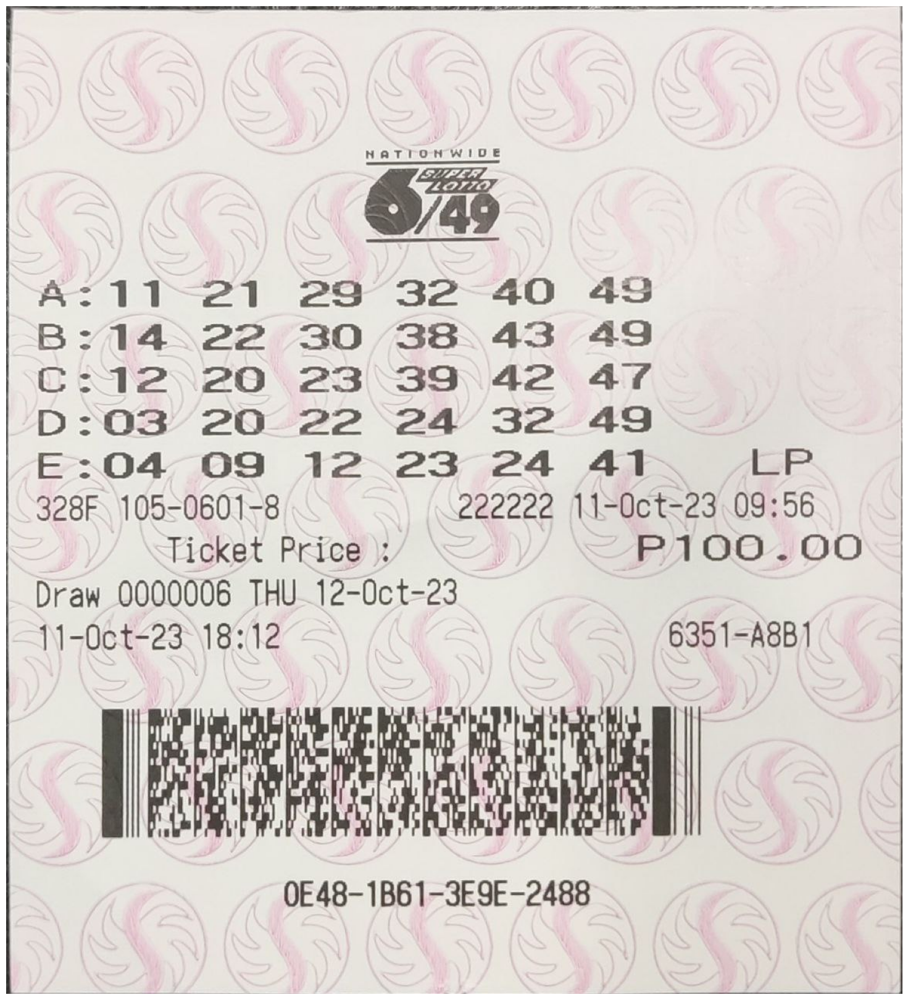

In [18]:
display(image_file)

# Invert Images

In [19]:
inverted_image = cv2.bitwise_not(img)
cv2.imwrite('temp/inverted.jpg', inverted_image)

True

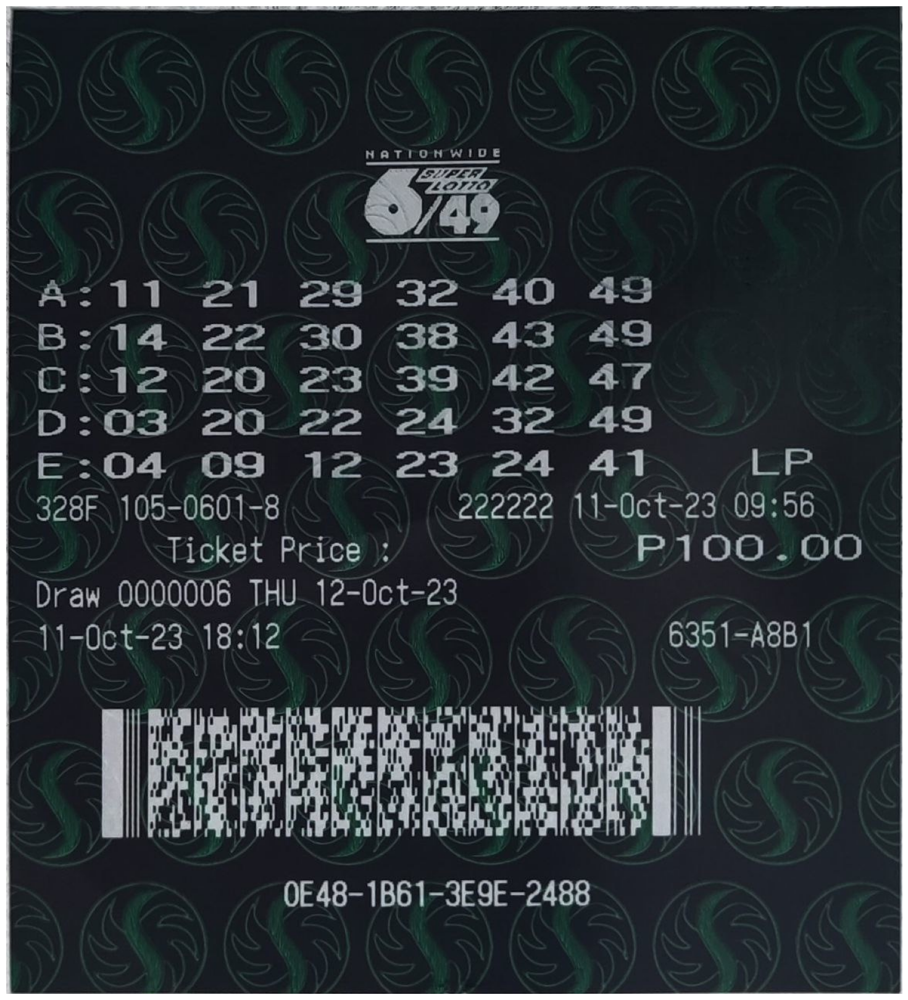

In [20]:
display('temp/inverted.jpg')

# Rescaling

 # Binarization

In [21]:
def grayscale(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

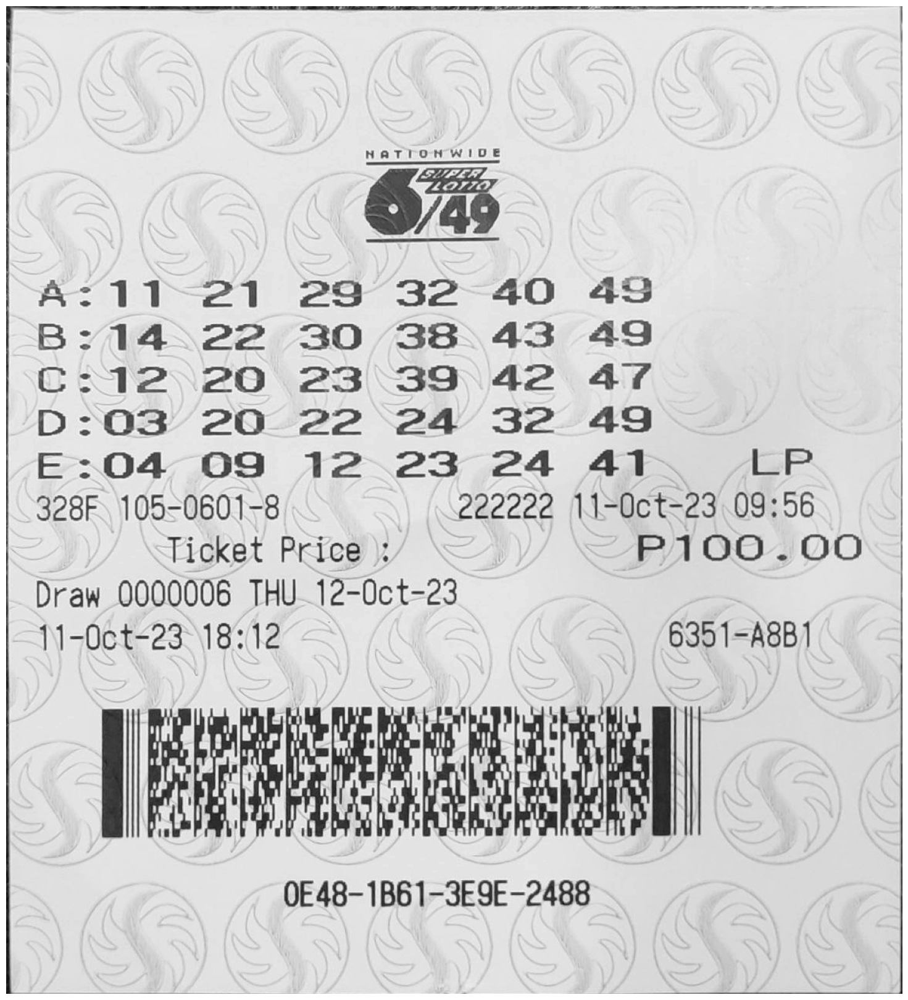

In [22]:
gray_image = grayscale(img)
cv2.imwrite('temp/gray.jpg', gray_image)
display('temp/gray.jpg')

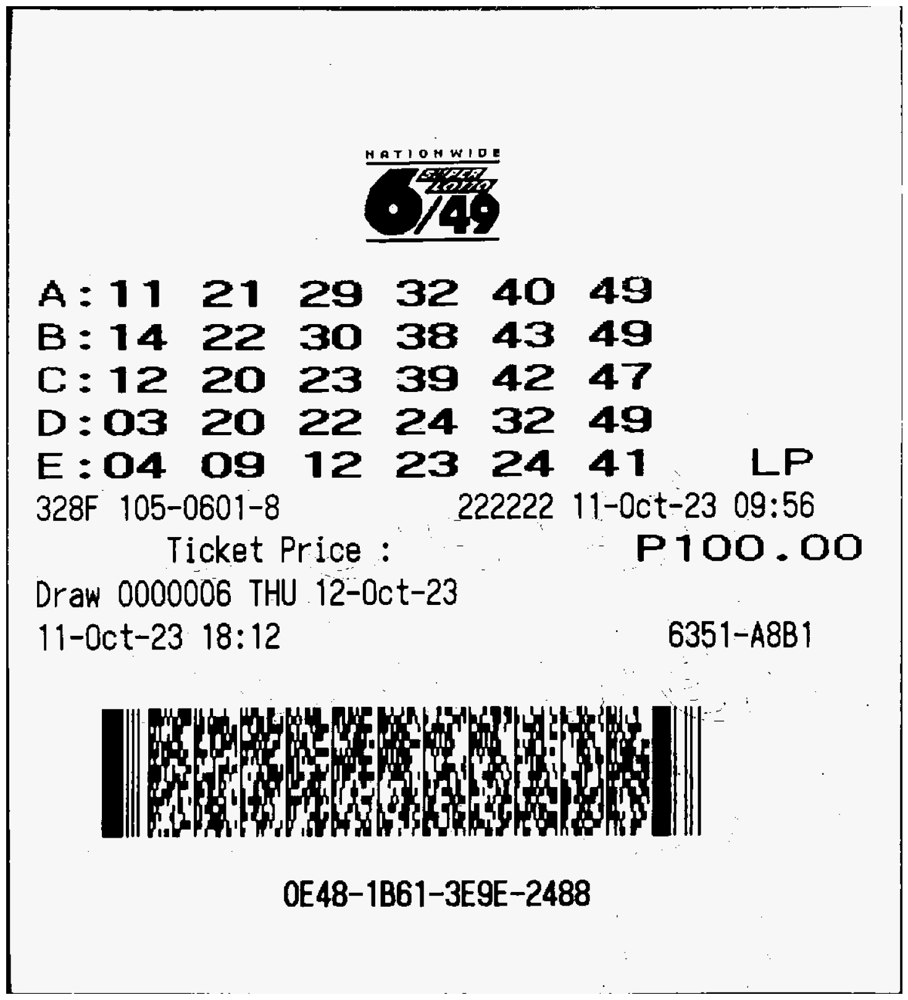

In [23]:
thresh, im_bw = cv2.threshold(gray_image, 180, 230, cv2.THRESH_BINARY)
cv2.imwrite('temp/bw_image.jpg', im_bw)
display('temp/bw_image.jpg')

# Noise Removal


In [24]:
def noise_removal(image):
    import numpy as np
    kernel = np.ones((1,1), np.uint8)
    image = cv2.dilate(image, kernel, iterations=1)
    kernal = np.ones((1,1), np.uint8)
    image = cv2.erode(image, kernel, iterations=1)
    image = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
    image = cv2.medianBlur(image, 3)
    return (image)

In [25]:
no_noise = noise_removal(im_bw)
cv2.imwrite('temp/no_noise.jpg', no_noise)

True

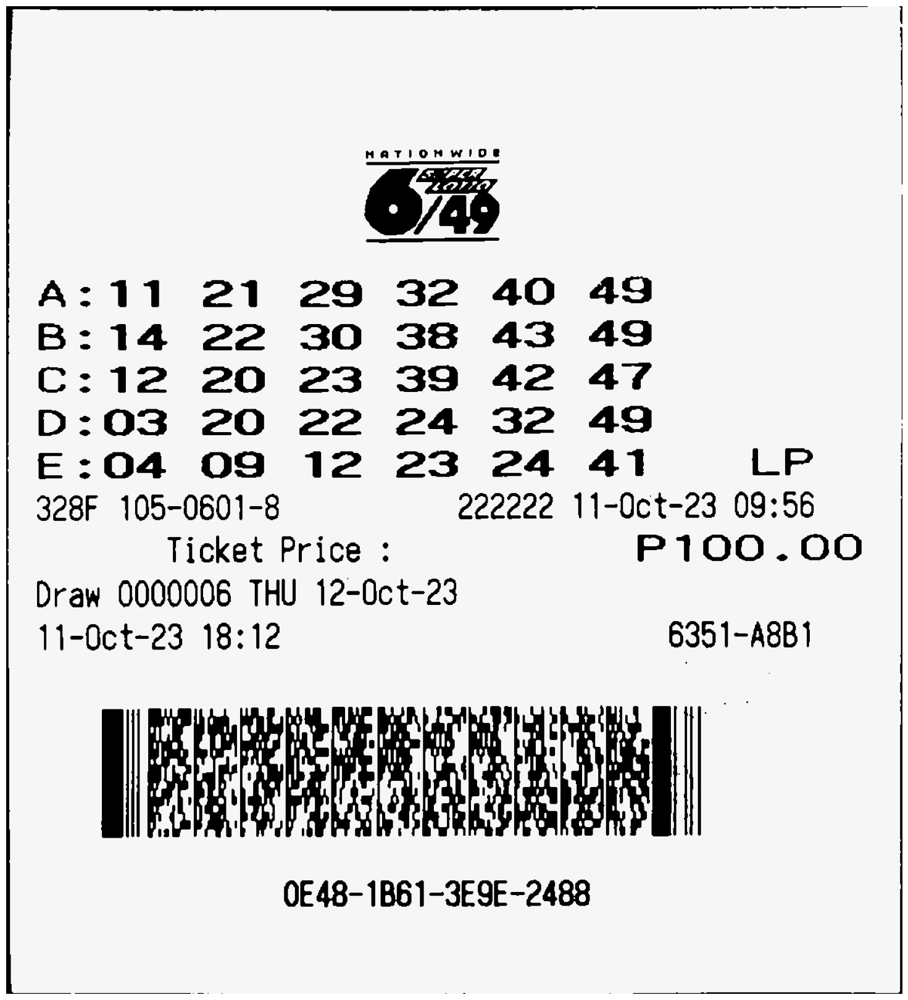

In [26]:
display('temp/no_noise.jpg')

 # Dialation and Erosion


In [27]:
def thin_font(image):
    import numpy as np
    image = cv2.bitwise_not(image)
    kernel = np.ones((2,2), np.uint8)
    image = cv2.erode(image, kernel, iterations=1)
    image = cv2.bitwise_not(image)

    return (image)

In [28]:
eroded_image = thin_font(no_noise)
cv2.imwrite('temp/eroded_image.jpg', eroded_image)

True

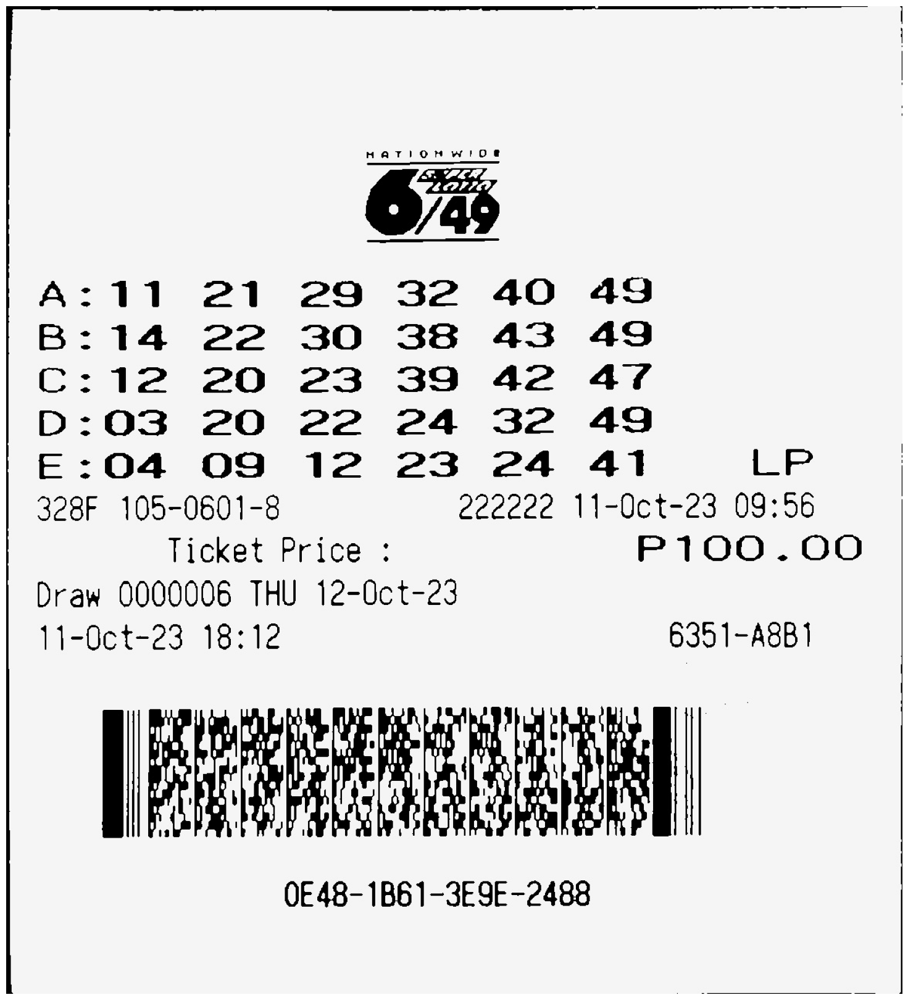

In [29]:
display('temp/eroded_image.jpg')

In [30]:
def thick_font(image):
    import numpy as np
    image = cv2.bitwise_not(image)
    kernel = np.ones((2,2), np.uint8)
    image = cv2.dilate(image, kernel, iterations=1)
    image = cv2.bitwise_not(image)

    return (image)

In [31]:
dialated_image = thick_font(no_noise)
cv2.imwrite('temp/dialated_image.jpg', dialated_image)

True

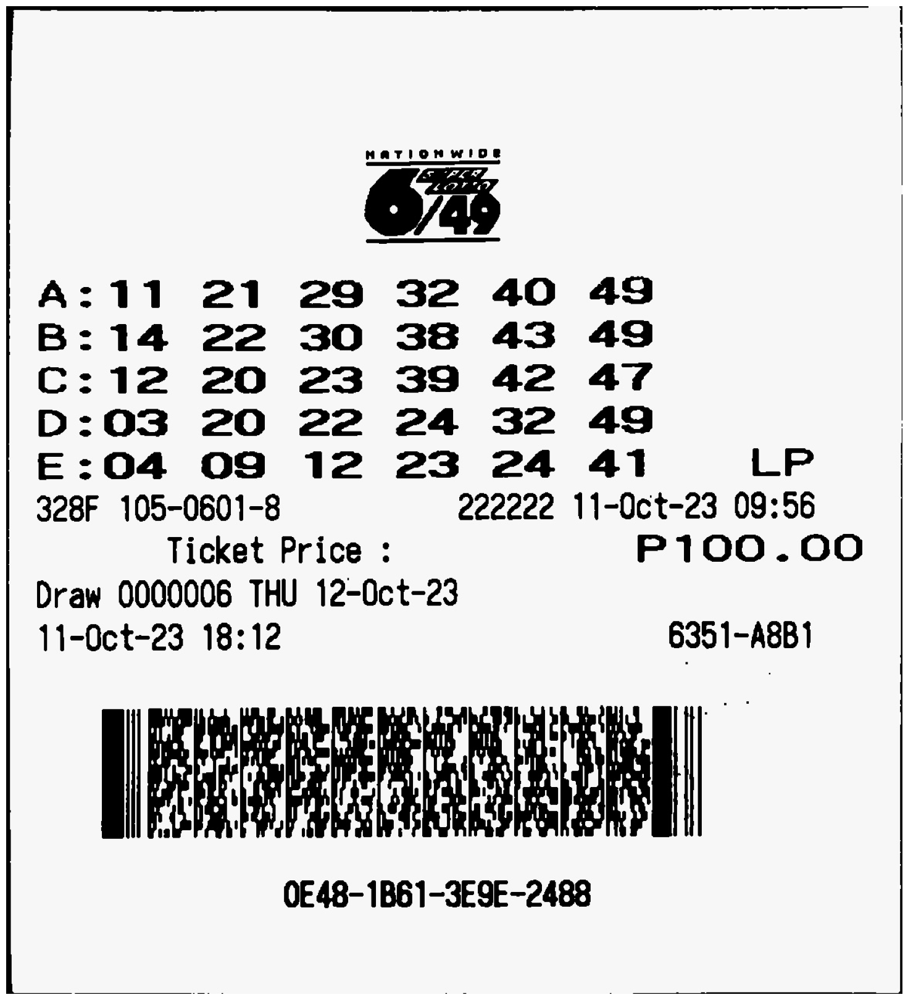

In [32]:
display('temp/dialated_image.jpg')

# Removing Borders

In [41]:
def remove_borders(image):
    contours, heiarchy = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cntSorted = sorted(contours, key=lambda x:cv2.contourArea(x))
    cnt = cntSorted[-1]
    x, y, w, h = cv2.boundingRect(cnt)
    crop = image[y:y+h, x:x+w]
    return (crop)

In [42]:
no_borders = remove_borders(dialated_image)
cv2.imwrite('temp/no_borders.jpg', no_borders)

True

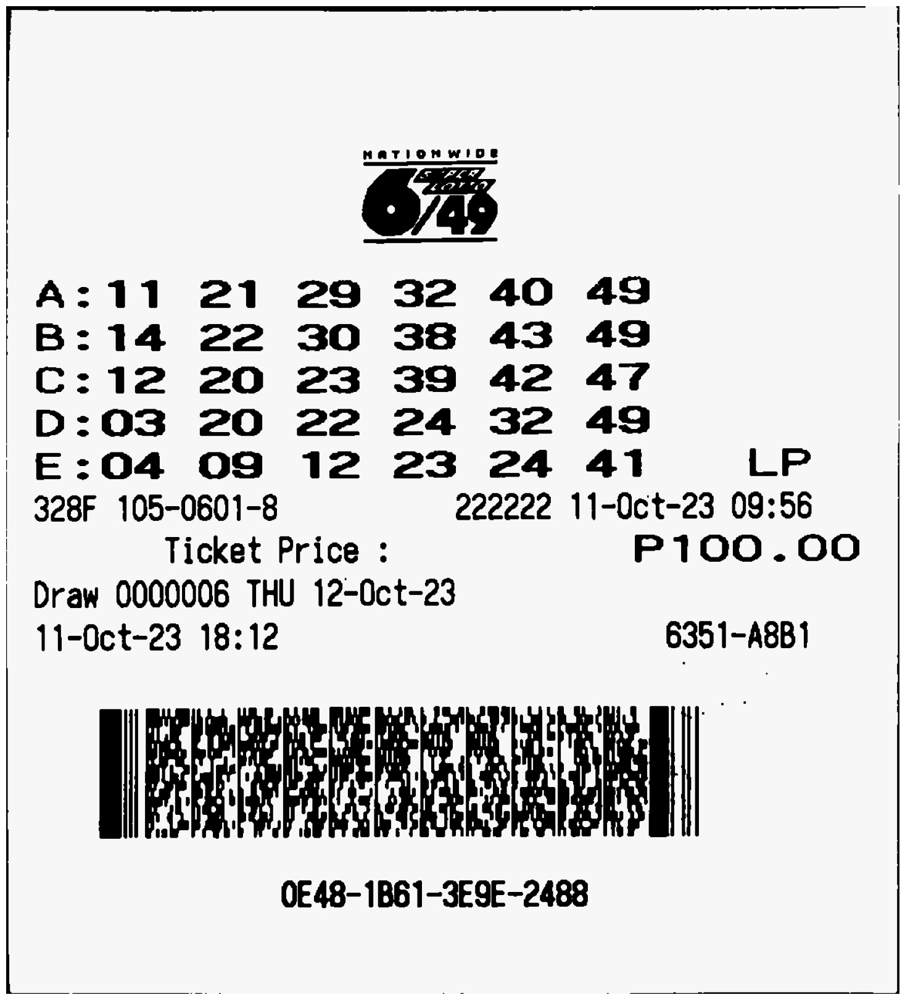

In [43]:
display('temp/no_borders.jpg')